# ¿Cómo podemos optimizar los recursos económicos de un club para lograr un rendimiento deportivo superador?

##Presentación del caso y datos##


###Cargamos librerías y dataset###






In [169]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [170]:
#Cargamos las librerías
import pandas                  as pd
from   scipy import stats
import numpy                   as np
import matplotlib.pyplot       as plt
import seaborn                 as sns
import statsmodels.formula.api as sm
### Load relevant packages
import pandas                  as pd
from   scipy import stats
import numpy                   as np
import matplotlib.pyplot       as plt
from matplotlib.ticker import MultipleLocator
import seaborn                 as sns
import statsmodels.formula.api as sm
import pandas_profiling
# https://community.plot.ly/t/solved-update-to-plotly-4-0-0-broke-application/26526/2
import os
#%matplotlib inline
#plt.style.use('ggplot')
from bokeh.resources import INLINE
import bokeh.io
from bokeh import *
bokeh.io.output_notebook(INLINE)
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
import statsmodels.api as sm
import statsmodels.formula.api as smf
import missingno as msno
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from mpl_toolkits.mplot3d import Axes3D



In [171]:
#Cargamos el dataset
df = 'https://raw.githubusercontent.com/adrianogennari22/coder/main/FM%202023.csv'
df = pd.read_csv (df)
df.head()

,Name,Position,Age,ca,pa,Nationality,Club,Corners,Crossing,Dribbling,...,World reputation,Race,RCA,Colour of skin,Date of birth,Number of national team appearances,Goals scored for the national team,Salary,Rental club,UID
0,Kevin De Bruyne,M/AM RLC,31,189,189,Belgium,Manchester City,14,19,15,...,9400,Northern_European,181,4,1991/6/28,91,24,394372.0,NaN,18004457
1,Kylian Mbappé,AM/S RL,23,188,197,France,Paris Saint-Germain,13,13,18,...,9248,African_Caribbean,172,13,1998/12/20,57,27,1035616.0,NaN,85139014
2,Robert Lewandowski,S,33,186,190,Poland,Barcelona,3,8,13,...,9250,Northern_European,183,3,1988/8/21,132,76,345204.0,NaN,719601
3,Erling Haaland,S,22,185,195,"Norway,England",Manchester City,7,10,14,...,8750,Northern_European,185,2,2000/7/21,21,20,394372.0,NaN,29179241
4,Mohamed Salah,AM/S RL,30,185,187,Egypt,Liverpool,12,14,17,...,8750,North_African__Middle_Eastern,181,9,1992/6/15,85,47,405971.0,NaN,98028755


Buscamos valores nulos y estadísticas del dataset

In [172]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8452 entries, 0 to 8451
Data columns (total 98 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Name                                 8452 non-null   object 
 1   Position                             8452 non-null   object 
 2   Age                                  8452 non-null   int64  
 3   ca                                   8452 non-null   int64  
 4   pa                                   8452 non-null   int64  
 5   Nationality                          8452 non-null   object 
 6   Club                                 8345 non-null   object 
 7   Corners                              8452 non-null   int64  
 8   Crossing                             8452 non-null   int64  
 9   Dribbling                            8452 non-null   int64  
 10  Finishing                            8452 non-null   int64  
 11  First Touch                   

In [173]:
def nulos(df):
  cant= len(df)
  for col in df.columns:
       print (col, ':', round(df[col].isnull().sum() *100 / cant, 2), '%')

nulos(df)

Name : 0.0 %
Position : 0.0 %
Age : 0.0 %
ca : 0.0 %
pa : 0.0 %
Nationality : 0.0 %
Club : 1.27 %
Corners : 0.0 %
Crossing : 0.0 %
Dribbling : 0.0 %
Finishing : 0.0 %
First Touch : 0.0 %
Free Kick Taking : 0.0 %
Heading : 0.0 %
Long Shots : 0.0 %
Long Throws : 0.0 %
Marking : 0.0 %
Passing : 0.0 %
Penalty Taking : 0.0 %
Tackling : 0.0 %
Technique : 0.0 %
Aggressiion : 0.0 %
Anticipation : 0.0 %
Bravery : 0.0 %
Composure : 0.0 %
Concentration : 0.0 %
Vision : 0.0 %
Decision : 0.0 %
Determination : 0.0 %
Flair : 0.0 %
Leadership : 0.0 %
Off The Ball : 0.0 %
Position.1 : 0.0 %
Teamwork : 0.0 %
Work Rate : 0.0 %
Acceleration : 0.0 %
Agility : 0.0 %
Balance : 0.0 %
Jumping Reach : 0.0 %
Natural Fitness : 0.0 %
Pace : 0.0 %
Stamina : 0.0 %
Strength : 0.0 %
Stability : 0.0 %
Foul : 0.0 %
Contest performance : 0.0 %
Injury : 0.0 %
diversity : 0.0 %
Aerial Reach : 0.0 %
Command Of Area : 0.0 %
Communication : 0.0 %
Eccentricity : 0.0 %
Handling : 0.0 %
Kicking : 0.0 %
One On Ones : 0.0 %
Reflex

<Axes: >

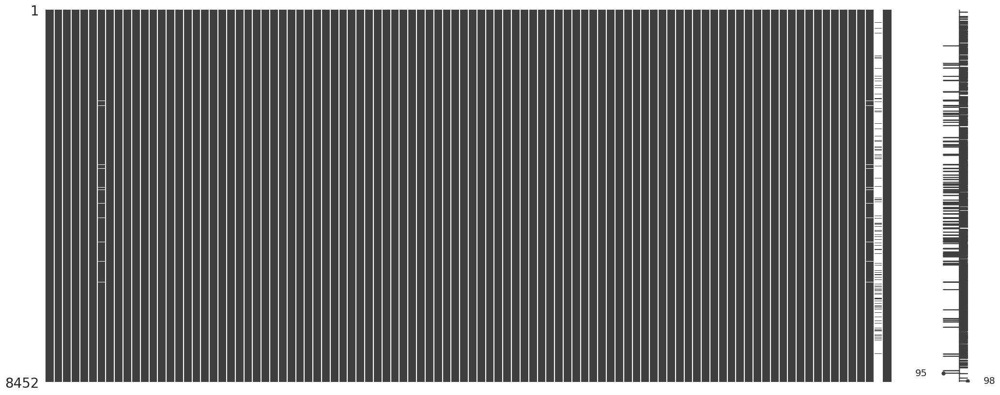

In [174]:
msno.matrix(df)

In [175]:
#Veamos si hay datos duplicados
print(df.shape)
train= df.drop_duplicates()
print(df.shape)

(8452, 98)
(8452, 98)


In [176]:
# Obtener las columnas de tipo 'object'
columnas_object = df.select_dtypes(include=['object']).columns
print (columnas_object)

Index(['Name', 'Position', 'Nationality', 'Club', 'Race', 'Date of birth',
       'Rental club'],
      dtype='object')


In [177]:
# Obtener las columnas de tipo numéricas
columnas_num = df.select_dtypes(include=['int64']).columns
print (columnas_num)

Index(['Age', 'ca', 'pa', 'Corners', 'Crossing', 'Dribbling', 'Finishing',
       'First Touch', 'Free Kick Taking', 'Heading', 'Long Shots',
       'Long Throws', 'Marking', 'Passing', 'Penalty Taking', 'Tackling',
       'Technique', 'Aggressiion', 'Anticipation', 'Bravery', 'Composure',
       'Concentration', 'Vision', 'Decision', 'Determination', 'Flair',
       'Leadership', 'Off The Ball', 'Position.1', 'Teamwork', 'Work Rate',
       'Acceleration', 'Agility', 'Balance', 'Jumping Reach',
       'Natural Fitness', 'Pace', 'Stamina', 'Strength', 'Stability', 'Foul',
       'Contest performance', 'Injury', 'diversity', 'Aerial Reach',
       'Command Of Area', 'Communication', 'Eccentricity', 'Handling',
       'Kicking', 'One On Ones', 'Reflexes', 'Rushing Out', 'Punching',
       'Throwing', 'Adaptation', 'Ambition', 'Argue', 'Loyal',
       'Resistant to stress', 'Professional', 'Sportsmanship',
       'Emotional control', 'GK', 'DL', 'DC', 'DR', 'WBL', 'WBR', 'DM', 'ML',
     

In [178]:
#Entre las columnas tipo object, encontramos algunas no relevantes para nuestra búsqueda.
#Entre las columnas numéricas, encontramos algunas no relevantes para nuestra búsqueda.
# UID es un identificador único del jugador.
df = df.drop(columns=['Race', 'RCA', 'Colour of skin', 'Position', 'Position.1', 'UID'])

In [179]:
#Convertimos la fecha de nacimiento en un dato datetime.
df['Date of birth'] = pd.to_datetime(df['Date of birth'])

In [180]:
# Columnas con porcentaje de nulos
pd.set_option('display.max_rows', None)  # or 1000
serie=(df.isnull().sum()/df.shape[0])*100
serie=serie.sort_values(ascending=False)
serie= serie[serie>0]
serie

Rental club    88.227638
Salary          1.265973
Club            1.265973
dtype: float64

In [181]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Age,8452.0,24.989115,15.0,21.0,25.0,29.0,44.0,5.39625
ca,8452.0,119.8146,45.0,114.0,123.0,129.0,189.0,17.919516
pa,8452.0,94.493256,-95.0,123.0,135.0,142.0,200.0,84.594675
Corners,8452.0,8.140558,1.0,6.0,8.0,11.0,20.0,3.366027
Crossing,8452.0,9.435045,1.0,7.0,10.0,12.0,19.0,3.429934
Dribbling,8452.0,10.819569,1.0,9.0,12.0,13.0,20.0,3.574914
Finishing,8452.0,9.170611,1.0,7.0,9.0,12.0,19.0,3.526125
First Touch,8452.0,12.039754,1.0,11.0,12.0,13.0,20.0,2.201608
Free Kick Taking,8452.0,8.626242,1.0,6.0,8.0,11.0,20.0,3.183615
Heading,8452.0,9.764316,1.0,7.0,10.0,13.0,20.0,3.505773


In [ ]:
df [['ca','pa','Age', 'Values', 'Salary']].describe().T

,count,mean,std,min,25%,50%,75%,max
ca,8452.0,1.198146e+02,1.791952e+01,45.0,114.0,123.0,129.0,189.0
pa,8452.0,9.449326e+01,8.459467e+01,-95.0,123.0,135.0,142.0,200.0
Age,8452.0,2.498912e+01,5.396250e+00,15.0,21.0,25.0,29.0,44.0
Values,8452.0,3.257098e+07,8.473163e+07,-1.0,1682008.5,4413815.5,13935000.0,347975206.0
Salary,8345.0,2.089091e+04,4.235218e+04,0.0,2821.0,8109.0,20792.0,1035616.0


In [ ]:
df [['ca','pa','Age', 'Values', 'Salary']].corr()

,ca,pa,Age,Values,Salary
ca,1.000000,0.712157,0.604545,0.224293,0.531861
pa,0.712157,1.000000,0.660409,0.113405,0.281639
Age,0.604545,0.660409,1.000000,0.313531,0.229482
Values,0.224293,0.113405,0.313531,1.000000,0.217607
Salary,0.531861,0.281639,0.229482,0.217607,1.000000


## ¿El valor de mercado de un jugador puede explicarse por su reputación?  Veamos algunas estadísticas ##

In [183]:
y=df["Values"].values
y


array([347975206, 347975206, 347975206, ...,      5199,     70999,
           70999])

In [184]:
reputacion_actual=df[['Current reputation'] ]
reputacion_actual=reputacion_actual.dropna()
x=reputacion_actual.values
x

array([[9450],
       [9398],
       [9300],
       ...,
       [3200],
       [2000],
       [2050]])

In [185]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=2)
from sklearn.linear_model import LinearRegression
# crear el modelo
lr = LinearRegression()
# Ajustar el modelo con X_train y y_train
lr.fit(X_train,y_train)
# PRedecir con X_test
y_pred = lr.predict(X_test)

In [186]:
from sklearn.metrics import mean_absolute_error
print("MAE",mean_absolute_error(y_test,y_pred))

MAE 46746235.925583795


In [187]:
from sklearn.metrics import mean_squared_error
print("MSE",mean_squared_error(y_test,y_pred))

MSE 7126942532668413.0


In [188]:
print("RMSE",np.sqrt(mean_squared_error(y_test,y_pred)))

RMSE 84421220.8669622


In [189]:
print("RMSE",np.log(np.sqrt(mean_squared_error(y_test,y_pred))))

RMSE 18.251329360035452


In [190]:
from sklearn.metrics import r2_score
r2 = r2_score(y_test,y_pred)
print(r2)

0.049742851124349174


Este coeficiente de determinación nos muestra que muy poco de la reputación de un jugador en la actualidad explica su valor, lo qu eindica que hay otras variables que tienen más peso, o bien hay mercados que no responden totalmente a la lógica. Seguiremos examinando el dataset para lograr nuevos acercamientos.
En cuanto a la desviación cuadrática media, podemos llegar a las mismas conclusiones



Probemos qué pasa si usamos la reputación mundial y no la reputación actual.

In [191]:
reputacion_mundial=df[['World reputation'] ]
reputacion_mundial=reputacion_mundial.dropna()
rm=reputacion_mundial.values
rm

array([[9400],
       [9248],
       [9250],
       ...,
       [1145],
       [ 474],
       [ 176]])

In [192]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(rm,y,test_size=0.2,random_state=2)
from sklearn.linear_model import LinearRegression
# crear el modelo
lr = LinearRegression()
# Ajustar el modelo con X_train y y_train
lr.fit(X_train,y_train)
# PRedecir con X_test
y_pred = lr.predict(X_test)

In [193]:
from sklearn.metrics import r2_score
r2 = r2_score(y_test,y_pred)
print(r2)

0.04446457835085382


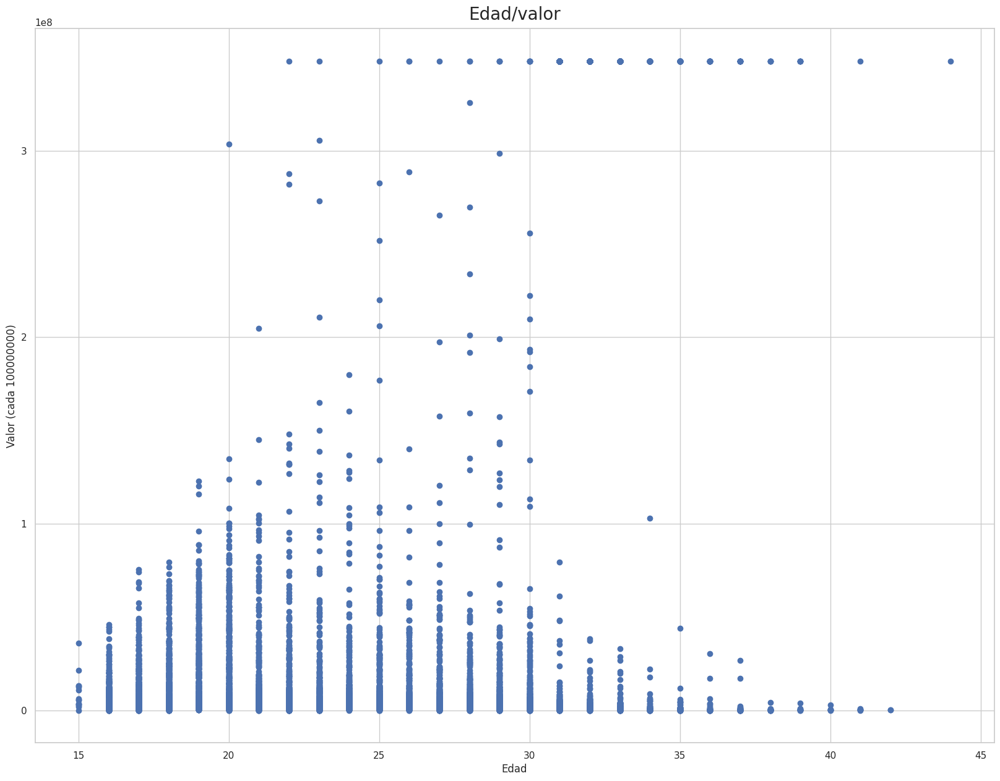

In [194]:
plt.scatter(df ['Age'],df ['Values'])
plt.title("Edad/valor", fontsize=20, verticalalignment='bottom')
plt.xlabel("Edad")
plt.ylabel("Valor (cada 100000000)")
plt.gca().xaxis.set_major_locator(MultipleLocator(5))
plt.gca().yaxis.set_major_locator(MultipleLocator(100000000))

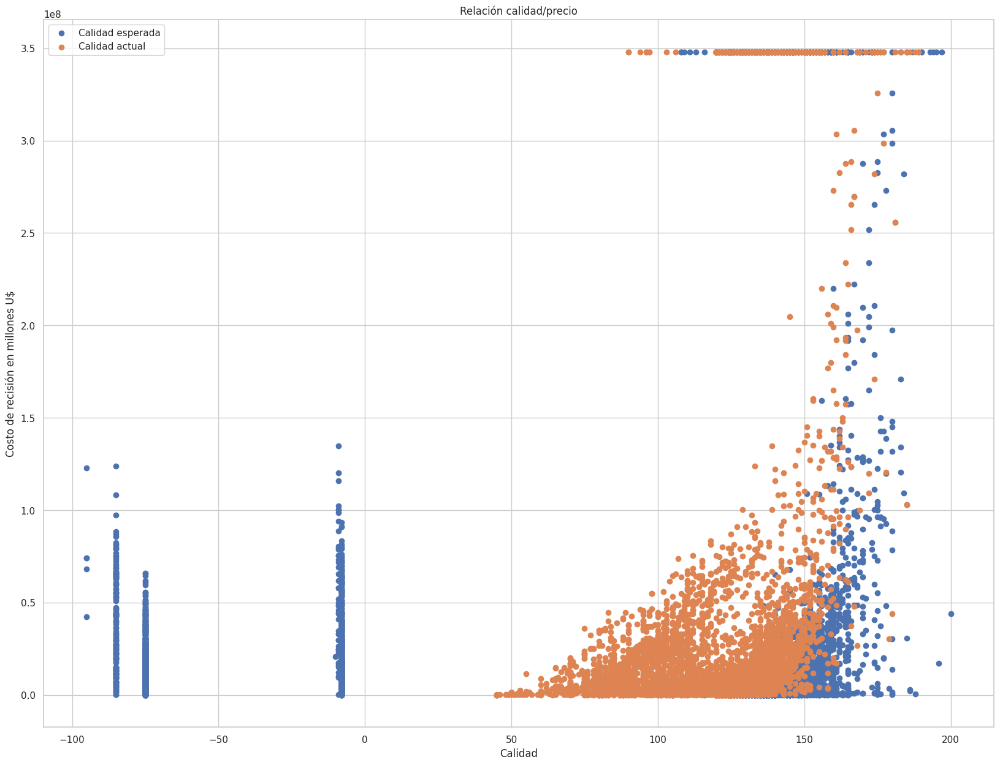

In [195]:
plt.scatter(df['pa'],df ['Values'], label='Calidad esperada')
plt.scatter(df['ca'],df ['Values'], label='Calidad actual')
plt.xlabel('Calidad')
plt.ylabel('Costo de recisión en millones U$')
plt.title('Relación calidad/precio')
plt.legend()
plt.show()

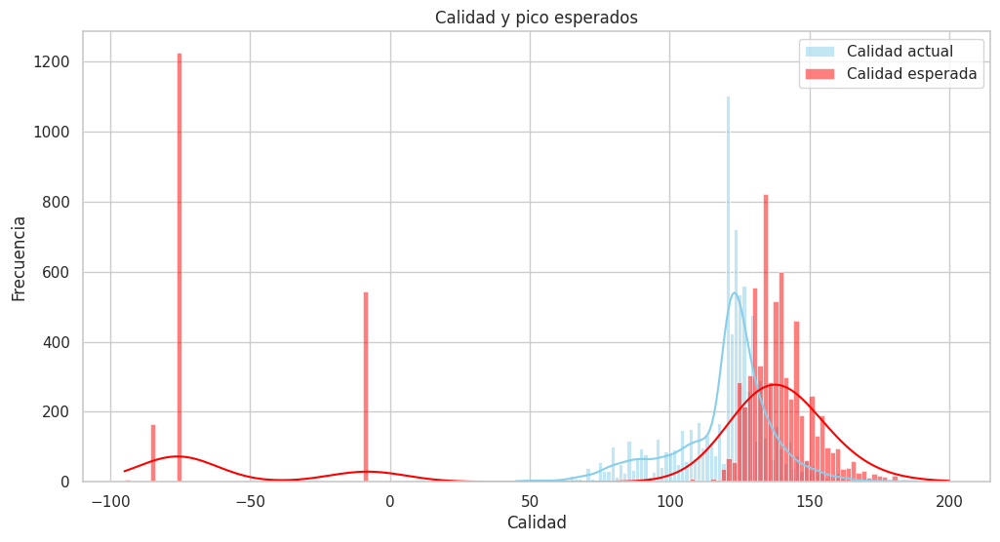

In [196]:
# Selección del gráfico
sns.set(style="whitegrid")

# Histograma para ca y pa
plt.figure(figsize=(12, 6))
sns.histplot(df['ca'], color="skyblue", label="Calidad actual", kde=True)
sns.histplot(df['pa'], color="red", label="Calidad esperada", kde=True)

# Agregando títulos y etiquetas
plt.title('Calidad y pico esperados')
plt.xlabel('Calidad')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

Vemos que hay diferencias, pero no son significativas. A partir de estas pruebas, podemos inferir que el valor de mercado de los futbolistas no se explica por su reputación, si no que tiene que ver con variables extrafutbolísticas (presencia en redes sociales, publicidad, contratos de televisación)

##¿Qué valores inciden en los salarios de los jugadores?##

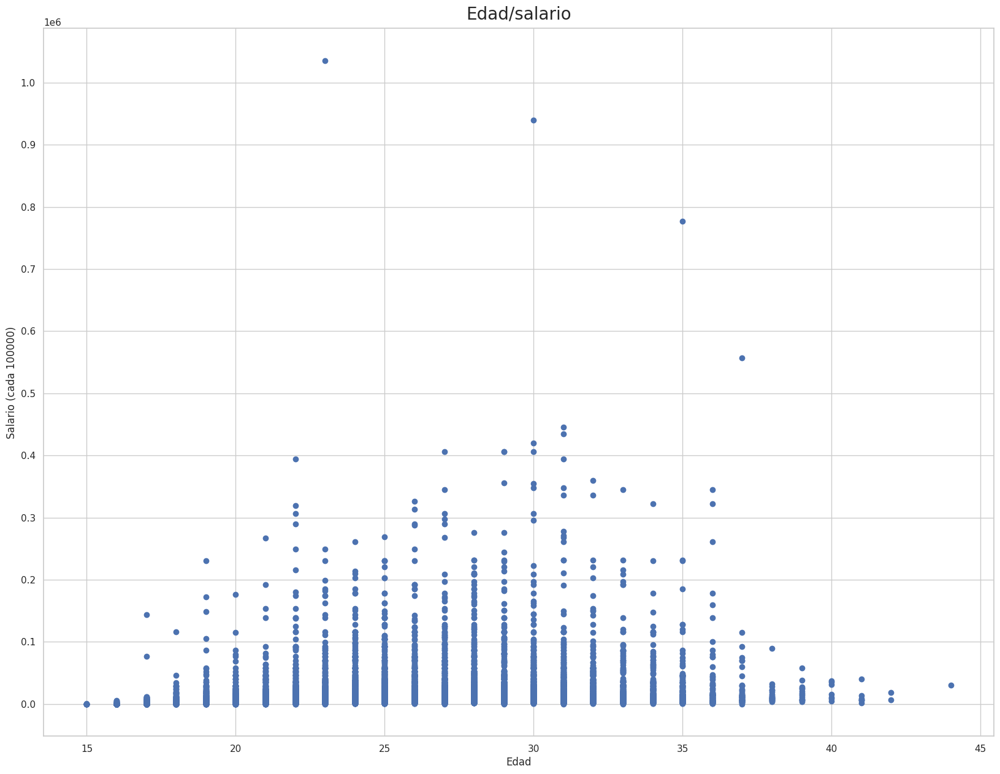

In [197]:
plt.scatter(df ['Age'],df ['Salary'])
plt.title("Edad/salario", fontsize=20, verticalalignment='bottom')
plt.xlabel("Edad")
plt.ylabel("Salario (cada 100000)")
plt.gca().xaxis.set_major_locator(MultipleLocator(5))
plt.gca().yaxis.set_major_locator(MultipleLocator(100000))

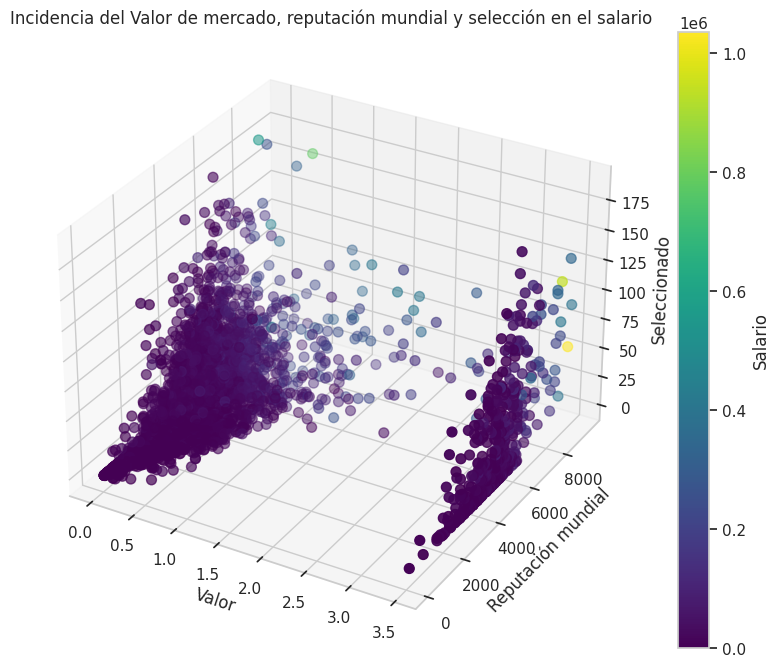

In [232]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(df['Values'], df['World reputation'], df['Number of national team appearances'], c=df['Salary'], cmap='viridis', s=50)

ax.set_xlabel('Valor')
ax.set_ylabel('Reputación mundial')
ax.set_zlabel('Seleccionado')
ax.set_title('Incidencia del Valor de mercado, reputación mundial y selección en el salario')

plt.colorbar(scatter, label='Salario')

plt.show()

##Algunos usos del modelo apuntado al entorno deportivo.



Busquemos qué características hacen que un jugador ocupe la posición de, supongamos, marcador central (DC en el dataframe, recordemos) Podemos establecer relación entre dos característicasque inciden en el juego. Luego, hagamos una clusterización siguiendo esas características.

Veamos cómo se relacionan las características de pegada y regate (y la aparición de jugadores con esas características)

<Axes: xlabel='Dribbling', ylabel='Kicking'>

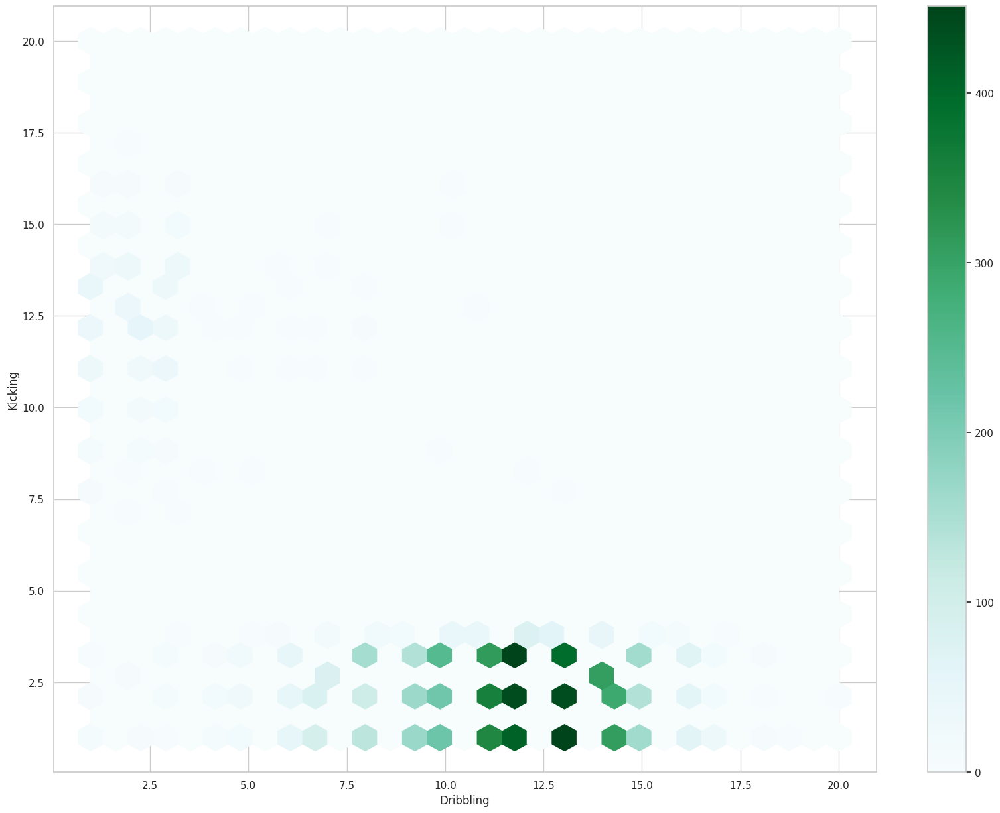

In [ ]:
df.plot.hexbin(x='Dribbling', y='Kicking', gridsize=30)

Generemos una visualización de características que esperamos en defensores

In [ ]:
df_defensor=df[['Concentration', 'Vision', 'Decision', 'Determination', 'Flair', 'Leadership', 'Command Of Area', 'Communication']]
df_defensor

,Concentration,Vision,Decision,Determination,Flair,Leadership,Command Of Area,Communication
0,15,20,18,17,16,13,3,1
1,14,15,15,15,18,13,2,2
2,17,13,17,20,14,15,2,3
3,15,14,13,20,16,13,4,1
4,15,17,15,18,15,11,2,2
5,14,18,17,18,17,11,1,2
6,15,18,18,19,12,15,1,3
7,16,9,16,16,14,13,16,14
8,16,14,17,16,12,17,2,1
9,11,20,18,20,20,14,2,3


In [199]:
columnas_deseadas = ['Concentration', 'Vision', 'Decision', 'Determination', 'Flair', 'Leadership', 'Command Of Area', 'Communication', 'DC']
caracteristicas_DC = df[columnas_deseadas]

In [200]:
X = caracteristicas_DC.drop(columns=['DC'])  # Características (todo excepto la columna que deseas predecir)
y = caracteristicas_DC['DC']  # Etiquetas (la columna que deseas predecir)

In [201]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [202]:
print("Dimensiones del conjunto de entrenamiento (X_train, y_train):", X_train.shape, y_train.shape)
print("Dimensiones del conjunto de prueba (X_test, y_test):", X_test.shape, y_test.shape)

Dimensiones del conjunto de entrenamiento (X_train, y_train): (6761, 8) (6761,)
Dimensiones del conjunto de prueba (X_test, y_test): (1691, 8) (1691,)


In [203]:
X_train

,Concentration,Vision,Decision,Determination,Flair,Leadership,Command Of Area,Communication
7448,10,12,11,10,11,7,3,3
2166,13,11,12,15,13,11,3,1
1583,10,14,10,3,18,5,4,1
1412,14,13,14,15,7,17,2,2
5681,12,14,14,10,12,8,2,3
2223,12,13,14,10,13,10,2,2
4961,13,8,13,13,5,10,3,3
6997,11,11,11,7,5,6,3,1
1507,12,11,12,12,11,12,3,2
2623,12,13,13,13,13,9,2,2


In [204]:
X_test

,Concentration,Vision,Decision,Determination,Flair,Leadership,Command Of Area,Communication
6994,10,9,11,10,11,8,2,2
4622,15,13,13,17,13,13,1,4
625,15,14,14,14,11,7,1,2
3395,11,9,12,14,7,6,1,2
7168,11,14,8,8,16,2,3,1
927,10,13,10,17,14,10,1,2
856,14,12,13,13,9,10,1,1
3172,13,13,13,12,12,14,4,1
7415,8,9,10,5,12,9,3,2
2921,13,11,13,15,6,12,3,2


In [205]:
# Creación del modelo SVM
modelo = SVC(C=0.0000001,kernel='sigmoid',random_state=42)

In [206]:
modelo.fit(X_train, y_train)

SVC(C=1e-07, kernel='sigmoid', random_state=42)

In [207]:
#Predicciones!
#y_train_pred = modelo.predict(X_train)
y_test_pred = modelo.predict(X_test)

In [208]:
X_test.shape

(1691, 8)

In [209]:
y_test_pred

array([1, 1, 1, ..., 1, 1, 1])

In [210]:
y_test

6994     1
4622     1
625     19
3395     1
7168     1
927      1
856     18
3172     1
7415     1
2921    12
4614     1
8333     1
8446     1
5020     1
1127     1
3463     1
2574     1
33       1
5583    20
353      1
7104     1
6021    19
4990     1
6194    20
5278    20
4762    20
2374     1
5908     1
6698     1
1597    20
6635     1
2465    20
623      1
7179     1
6897     1
4560     1
6187    20
3039     1
2063    20
4952     1
7384     1
2273    20
5504     1
6271     1
461      1
6341     1
5953     1
712      1
1002     1
4471     1
7520    20
6764     1
3129     1
6098    20
4353     8
3066     1
7768    20
4374     1
4634     1
3305     1
4771     1
2246     1
3682     1
318      1
7571     1
7781     8
8196     1
5086     1
7326     1
3504     1
5119    20
6726     1
8152     1
6885     1
6512     1
3100     1
1790     1
1844     1
7550     1
1941     1
7949     1
4716     1
6592     1
6576     1
2131     1
5190     1
586      1
6462     1
6182    20
2960    20
3139     1

In [211]:
#Calculo el accuracy en Test
from sklearn.metrics import accuracy_score
test_accuracy = accuracy_score(y_test, y_test_pred)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.7185097575399172


In [212]:
#Podríamos suponer a priori que la aptitud de un jugador en liderazgo determinará su aptitud como marcador central, grafiquemos esta hipótesis y probemos con otras características.


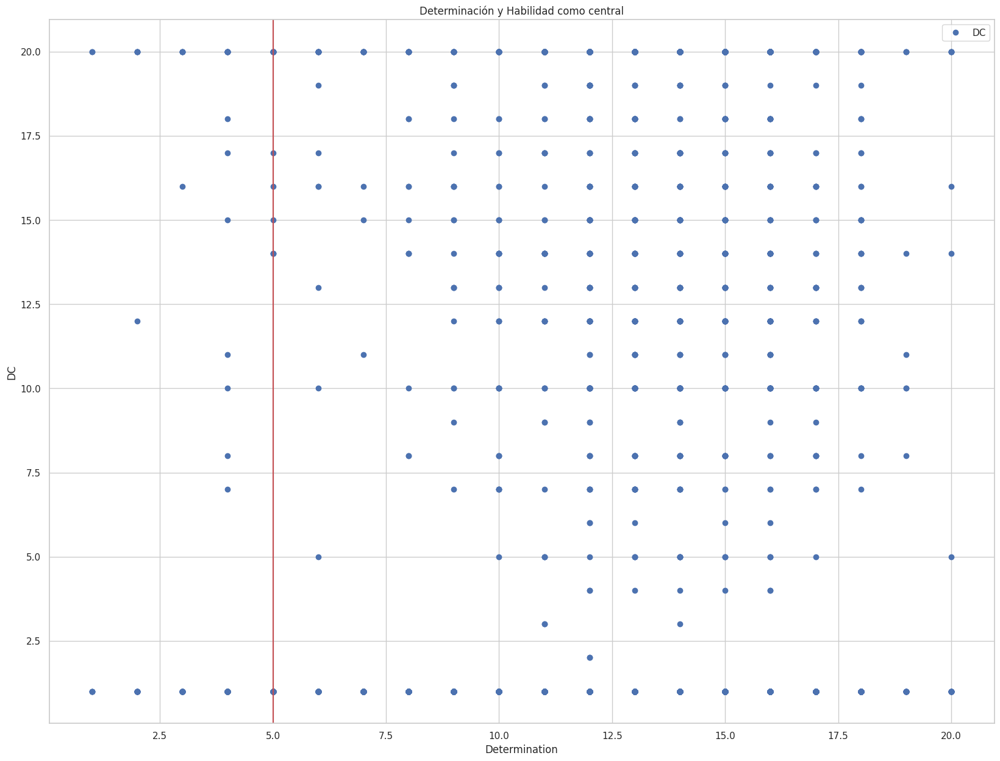

In [213]:
df.plot(x='Determination', y='DC', style="o")
plt.title('Determinación y Habilidad como central')
plt.xlabel('Determination')
plt.ylabel('DC')
plt.axvline(x=5,color='r')
plt.show()

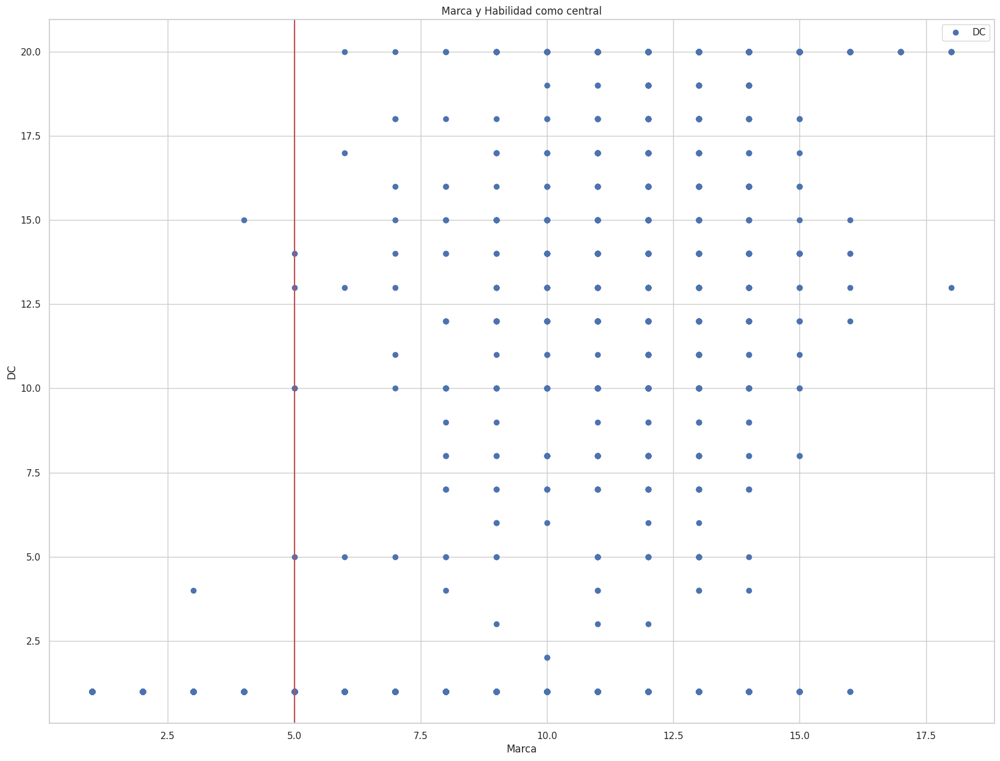

In [214]:
df.plot(x='Marking', y='DC', style="o")
plt.title('Marca y Habilidad como central')
plt.xlabel('Marca')
plt.ylabel('DC')
plt.axvline(x=5,color='r')
plt.show()

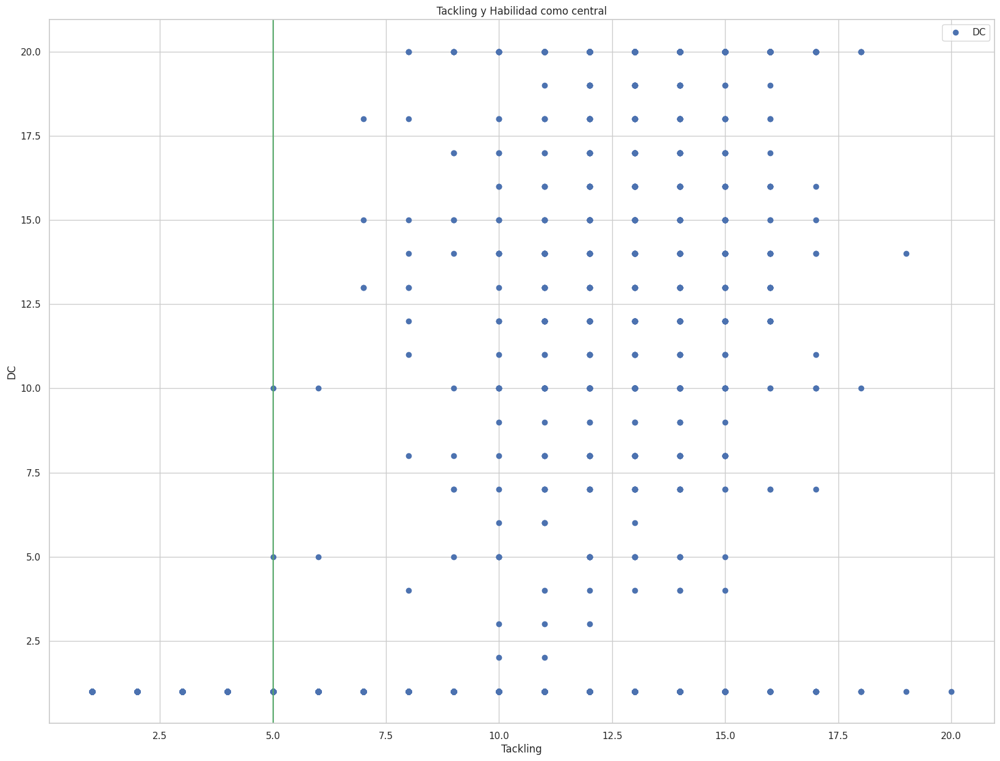

In [215]:
df.plot(x='Tackling', y='DC', style="o")
plt.title('Tackling y Habilidad como central')
plt.xlabel('Tackling')
plt.ylabel('DC')
plt.axvline(x=5,color='g')
plt.show()

<Axes: xlabel='Dribbling', ylabel='Kicking'>

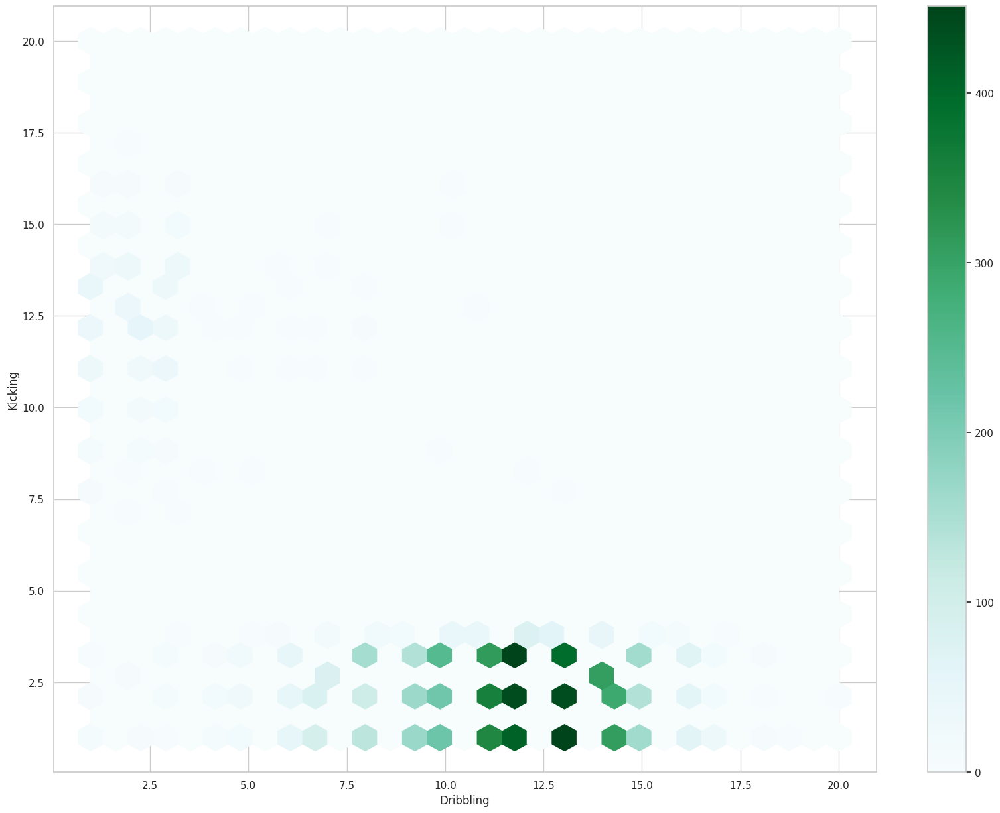

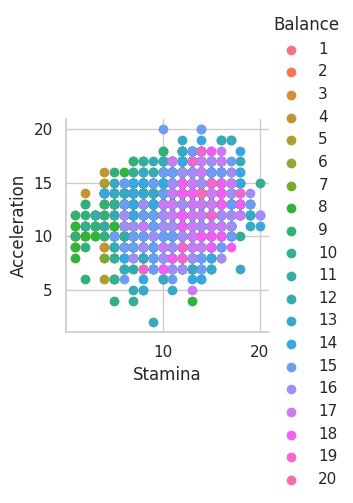

In [247]:
sns.FacetGrid(df,hue = 'Balance').map(plt.scatter,'Stamina','Acceleration').add_legend();
plt.show()

Vemos, como se esperaba, que los jugadores con más balance físico se concentran en los puntos más altos de aguante y aceleración.

Veamos las métricas de estas predicciones

In [216]:
tree = DecisionTreeClassifier(random_state=42)
tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [217]:
y_test_pred = tree.predict(X_test) #Prediccion en Test

In [233]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_test_pred)

0.644589000591366

In [234]:
confusion_matrix(y_test, y_test_pred)

array([[951,   2,   2,   8,   2,  11,   6,   2,  15,   1,  20,   7,  24,
         11,   7,   9,   5,   1, 131],
       [  1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [  2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [  3,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [  2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [  2,   0,   0,   0,   0,   0,   0,   0,   1,   0,   0,   0,   2,
          0,   0,   0,   0,   0,   1],
       [  8,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          1,   0,   0,   0,   0,   2],
       [  1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   1],
       [ 24,   0,   0,   0,   0,   2,   0,   0,   0,   0,   0,   0,   1,
          1,   0,   0,   0,   0

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


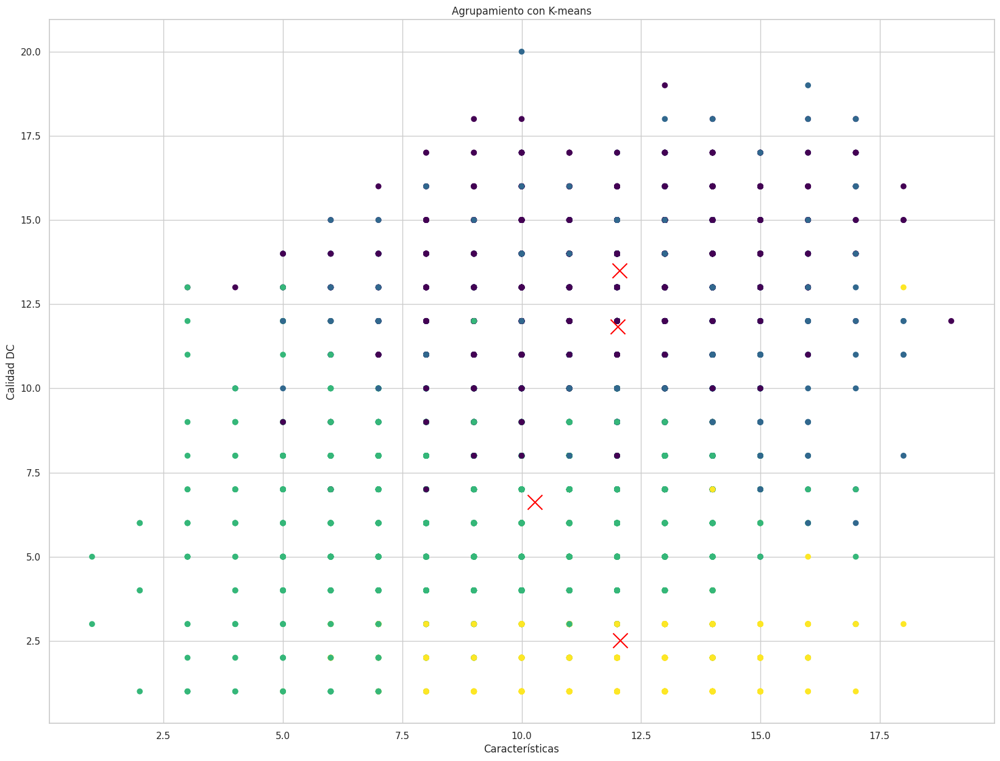

In [236]:

X = df[['Concentration','Tackling', 'Decision', 'Determination', 'Flair', 'Leadership', 'Command Of Area', 'Communication', 'Marking', 'DC']].values
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters)
kmeans.fit(X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_
plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=300, c='red')
plt.title('Agrupamiento con K-means')
plt.xlabel('Características')
plt.ylabel('Calidad DC')
plt.show()
df_clustered = df.copy()
df_clustered['cluster_label'] = labels


In [221]:
#Creacion del modelo con statsmodels.api.
X = df['Marking'] # X: variables independientes
X = sm.add_constant(X)# Se agrega una intercepción (beta_0) al modelo
y = df['DC'] # Y: variable respuesta (o variable dependiente)

# Fiteamos el modelo
mod1 = sm.OLS(y, X).fit()
predictions = mod1.predict(X)

In [222]:
#Veamos qué métricas podemos extraer
mod1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     DC   R-squared:                       0.410
Model:                            OLS   Adj. R-squared:                  0.410
Method:                 Least Squares   F-statistic:                     5862.
Date:                Sat, 25 May 2024   Prob (F-statistic):               0.00
Time:                        01:33:41   Log-Likelihood:                -26858.
No. Observations:                8452   AIC:                         5.372e+04
Df Residuals:                    8450   BIC:                         5.373e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.4977      0.156    -35.312      0.000      -5.803      -5.192
Marking        1.2493      0.016     76.566      0.000       1.217       1.281
==============================================================================
Omnibus:                      563.422   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              240.021
Skew:                           0.193   Prob(JB):                     7.59e-53
Kurtosis:                       2.271   Cond. No.                         23.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [223]:
mod2 = smf.ols('DC ~ Marking', data=df).fit()
print(mod2.summary())

                            OLS Regression Results                            
Dep. Variable:                     DC   R-squared:                       0.410
Model:                            OLS   Adj. R-squared:                  0.410
Method:                 Least Squares   F-statistic:                     5862.
Date:                Sat, 25 May 2024   Prob (F-statistic):               0.00
Time:                        01:33:41   Log-Likelihood:                -26858.
No. Observations:                8452   AIC:                         5.372e+04
Df Residuals:                    8450   BIC:                         5.373e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -5.4977      0.156    -35.312      0.0

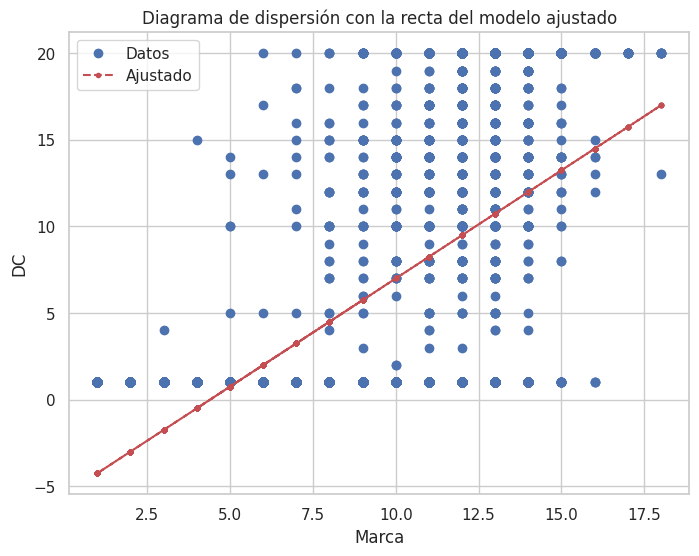

In [224]:
#Recta de regresion estimada
fig, ax = plt.subplots(figsize=(8,6))                                    # Ajuste del gráfico
ax.plot(df['Marking'] , df['DC'] , 'o', label="Datos")                         # Ajuste para las etiquetas del gráfico
ax.plot(df["Marking"], mod2.fittedvalues, 'r--.', label="Ajustado")           # Ajuste para las etiquetas del gráfico
legend = ax.legend(loc="best")                                           # Ajustes para las leyendas del gráfico
plt.xlabel('Marca')                                          # Etiqueta del eje X
plt.ylabel('DC')                                               # Etiqueta del eje Y
plt.title('Diagrama de dispersión con la recta del modelo ajustado');    # Título del gráfico

In [225]:
# Separar en X y y
print(X.shape, y.shape)

(8452, 2) (8452,)


In [226]:
skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

In [227]:
skf.get_n_splits(X, y)

5

In [228]:
train, test = list(skf.split(X, y))[1]
train

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


array([   1,    2,    3, ..., 8449, 8450, 8451])

In [229]:
n_folds = 5

In [230]:
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)